# Customer Credit Risk Prediction

# Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from sklearn.impute import KNNImputer
from sklearn.neighbors import LocalOutlierFactor
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import class_weight
from sklearn.model_selection import cross_val_score
from sklearn import ensemble
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from keras.models import Sequential
from keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, f1_score

# Loading The Data

In [2]:
df = pd.read_csv(r"data\train.csv")
df_test = pd.read_csv(r"data\test.csv")

print("Data shape:", df.shape)
print("Test data shape:", df_test.shape)

Data shape: (81738, 21)
Test data shape: (40869, 20)


In [3]:
df.head()

,loan_amnt,funded_amnt,pymnt_plan,grade,sub_grade_num,short_emp,emp_length_num,home_ownership,dti,purpose,...,delinq_2yrs,delinq_2yrs_zero,inq_last_6mths,last_delinq_none,last_major_derog_none,open_acc,pub_rec,pub_rec_zero,revol_util,bad_loans
0,5000,5000,n,B,0.4,0,11,RENT,27.65,credit_card,...,0.0,1.0,1.0,1,1,3.0,0.0,1.0,83.7,0
1,2400,2400,n,C,1.0,0,11,RENT,8.72,small_business,...,0.0,1.0,2.0,1,1,2.0,0.0,1.0,98.5,0
2,5000,5000,n,A,0.8,0,4,RENT,11.20,wedding,...,0.0,1.0,3.0,1,1,9.0,0.0,1.0,28.3,0
3,3000,3000,n,E,0.2,0,10,RENT,5.35,car,...,0.0,1.0,2.0,1,1,4.0,0.0,1.0,87.5,0
4,5600,5600,n,F,0.4,0,5,OWN,5.55,small_business,...,0.0,1.0,2.0,1,1,11.0,0.0,1.0,32.6,1


In [4]:
df.tail()

,loan_amnt,funded_amnt,pymnt_plan,grade,sub_grade_num,short_emp,emp_length_num,home_ownership,dti,purpose,...,delinq_2yrs,delinq_2yrs_zero,inq_last_6mths,last_delinq_none,last_major_derog_none,open_acc,pub_rec,pub_rec_zero,revol_util,bad_loans
81733,24000,24000,n,G,0.4,0,11,MORTGAGE,26.27,medical,...,1.0,0.0,0.0,0,0,12.0,0.0,1.0,94.1,0
81734,6000,6000,n,D,0.6,1,1,RENT,6.41,other,...,0.0,1.0,2.0,0,1,9.0,0.0,1.0,55.9,0
81735,6000,6000,n,B,1.0,0,5,MORTGAGE,18.69,debt_consolidation,...,1.0,0.0,2.0,0,1,14.0,0.0,1.0,29.5,1
81736,15250,15250,n,D,0.4,0,11,MORTGAGE,11.26,debt_consolidation,...,1.0,0.0,2.0,0,0,8.0,2.0,0.0,15.2,0
81737,22000,22000,n,D,1.0,0,11,MORTGAGE,18.45,debt_consolidation,...,0.0,1.0,5.0,1,1,18.0,1.0,0.0,46.3,1


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81738 entries, 0 to 81737
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   loan_amnt              81738 non-null  int64  
 1   funded_amnt            81738 non-null  int64  
 2   pymnt_plan             81738 non-null  object 
 3   grade                  81738 non-null  object 
 4   sub_grade_num          81738 non-null  float64
 5   short_emp              81738 non-null  int64  
 6   emp_length_num         81738 non-null  int64  
 7   home_ownership         81738 non-null  object 
 8   dti                    81738 non-null  float64
 9   purpose                81738 non-null  object 
 10  payment_inc_ratio      81737 non-null  float64
 11  delinq_2yrs            81722 non-null  float64
 12  delinq_2yrs_zero       81722 non-null  float64
 13  inq_last_6mths         81722 non-null  float64
 14  last_delinq_none       81738 non-null  int64  
 15  la

# Exploratory Data Analysis (EDA)

In [6]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Removing Redundant Features

The "pymnt_plan" feature consists only of "False" boolean value. Since it does not provide useful information, we delete it.

In [7]:
df.drop('pymnt_plan', axis=1, inplace=True)

### Defining Categorical Features 

For easier data analysis, lets specify our categorical features.

In [8]:
categorical_columns = ["grade", "sub_grade_num", "short_emp", "home_ownership", "purpose", "delinq_2yrs_zero", "last_delinq_none", "last_major_derog_none", "pub_rec_zero"]
df.loc[:, categorical_columns] = df.loc[:, categorical_columns].astype('category')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81738 entries, 0 to 81737
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   loan_amnt              81738 non-null  int64   
 1   funded_amnt            81738 non-null  int64   
 2   grade                  81738 non-null  category
 3   sub_grade_num          81738 non-null  category
 4   short_emp              81738 non-null  category
 5   emp_length_num         81738 non-null  int64   
 6   home_ownership         81738 non-null  category
 7   dti                    81738 non-null  float64 
 8   purpose                81738 non-null  category
 9   payment_inc_ratio      81737 non-null  float64 
 10  delinq_2yrs            81722 non-null  float64 
 11  delinq_2yrs_zero       81722 non-null  category
 12  inq_last_6mths         81722 non-null  float64 
 13  last_delinq_none       81738 non-null  category
 14  last_major_derog_none  81738 non-null 

### Summary Information About Quantitative Features 

In [9]:
df.describe()

,loan_amnt,funded_amnt,emp_length_num,dti,payment_inc_ratio,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_util,bad_loans
count,81738.000000,81738.000000,81738.000000,81738.000000,81737.000000,81722.000000,81722.000000,81722.000000,81722.000000,81738.000000,81738.000000
mean,12810.487166,12735.070591,6.381756,15.496182,7.555679,0.210837,0.982710,10.459007,0.104366,53.790952,0.189288
std,7936.485839,7888.874254,3.735226,7.489666,4.124174,0.660849,1.260642,4.731931,0.361557,25.755135,0.391739
min,500.000000,500.000000,0.000000,0.000000,0.028895,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6625.000000,6600.000000,3.000000,9.880000,4.356000,0.000000,0.000000,7.000000,0.000000,34.800000,0.000000
50%,11000.000000,10950.000000,6.000000,15.270000,6.953560,0.000000,1.000000,10.000000,0.000000,55.800000,0.000000
75%,17600.000000,17475.000000,11.000000,20.840000,10.206200,0.000000,2.000000,13.000000,0.000000,74.500000,0.000000
max,35000.000000,35000.000000,11.000000,39.880000,54.171000,29.000000,32.000000,76.000000,11.000000,150.700000,1.000000


### Summary Information About Categorical Features 

In [10]:
df.describe(include = ['category'])

,grade,sub_grade_num,short_emp,home_ownership,purpose,delinq_2yrs_zero,last_delinq_none,last_major_derog_none,pub_rec_zero
count,81738,81738.0,81738,81738,81738,81722.0,81738,81738,81722.0
unique,7,5.0,2,4,12,2.0,2,2,2.0
top,B,0.8,0,MORTGAGE,debt_consolidation,1.0,1,1,1.0
freq,24775,17073.0,71682,39583,45428,70156.0,48157,71497,74165.0


### Target Variable Ratio

In [11]:
def target_variable_ratio(target):
    plt.pie(target.value_counts(),
            labels = set(target),
            colors = sns.color_palette("Blues"),
            autopct = '%1.1f%%')
    plt.show()

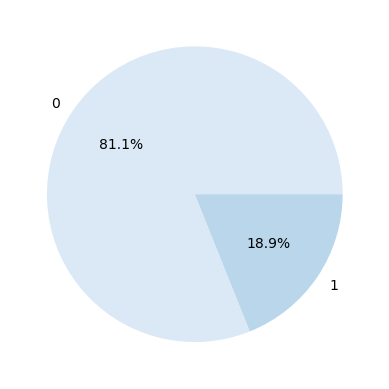

In [12]:
target_variable_ratio(df.bad_loans)

### Categorical Features Ratio 

In [13]:
def show_categorical_features_ratio(data):
    
    categorical_columns = [column for column in data.columns if data[column].dtypes == "category"]
    categ = data.loc[:, categorical_columns]
    
    fig, axes = plt.subplots(3, 3, figsize = (20, 20))
    for i, col in enumerate(categ):
        column_values = data[col].value_counts()
        labels = column_values.index
        sizes = column_values.values
        axes[i//3, i%3].pie(sizes, labels = labels, colors = sns.color_palette("Blues"), autopct = '%1.0f%%', startangle = 90)
        axes[i//3, i%3].axis('equal')
        axes[i//3, i%3].set_title(col)
    
    plt.show()

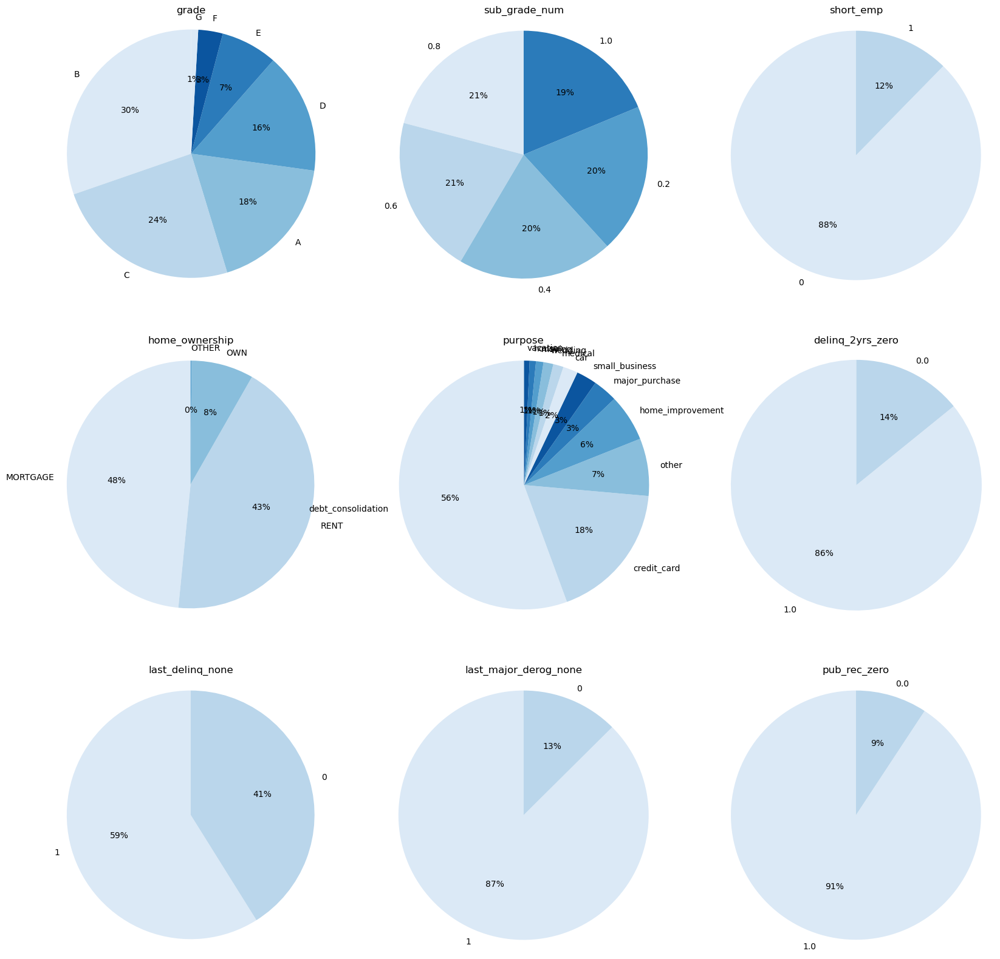

In [14]:
show_categorical_features_ratio(df)

### Quantitative Features Distribution

In [15]:
def show_distibutions(data):
    plt.figure(figsize=(25, 50))
    quantitive_columns = [column for column in data.columns if data[column].dtypes != "category"][:-1]
    try:
        for i, col in enumerate(quantitive_columns):
            plt.subplot(10, 3, i + 1)
            plt.hist(data[col], label=col, color=sns.color_palette("Blues")[4])
            plt.legend()
            plt.title(col)
            plt.tight_layout()
    except Exception as e:
        print(col,e)
    plt.show()

In [16]:
def show_boxplot(data):
    columns = [column for column in data.columns if data[column].dtypes in ("int64", "float64")][:-1]
    rows = int(np.ceil(len(columns)/5))
    column_num = 5 if len(columns) >= 5 else len(columns)
    
    fig, axes = plt.subplots(rows, column_num, figsize=(15, rows*5))        

    for i, el in enumerate(columns):
        sns.boxplot(y = el, palette = "Blues", data = data, ax = axes[i//5, i%5])

    plt.tight_layout() 

    plt.show()

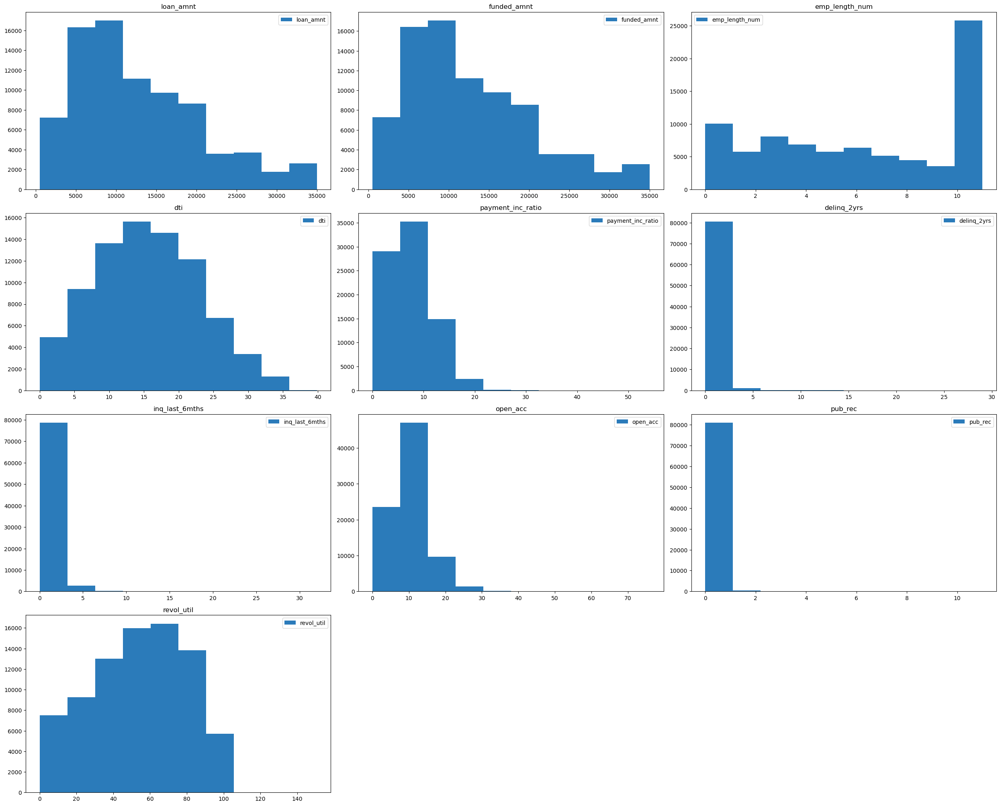

In [17]:
show_distibutions(df)

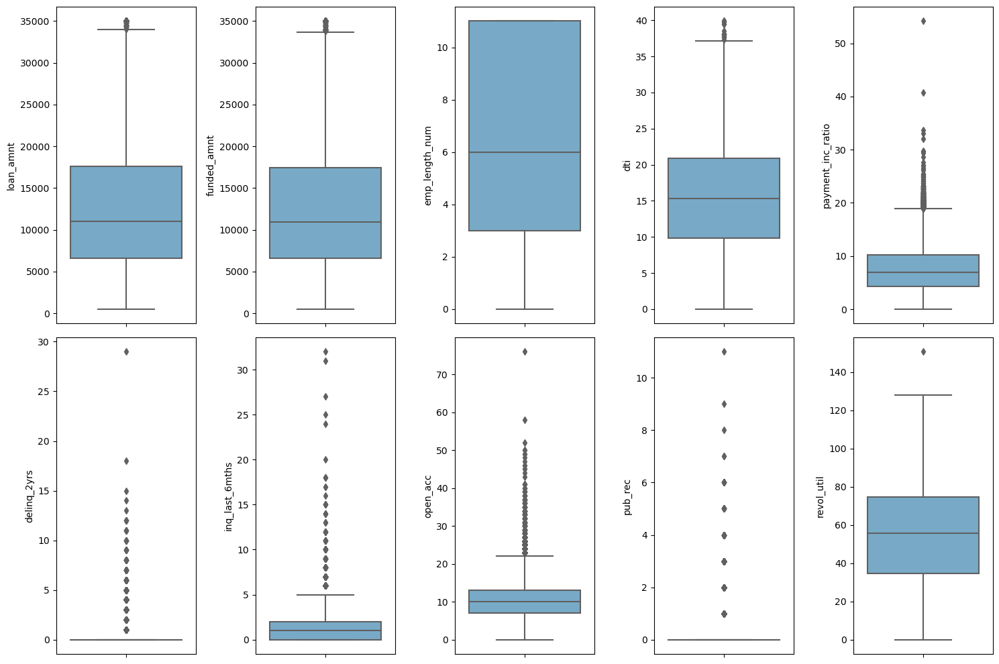

In [18]:
show_boxplot(df)

### Pairplot of Features

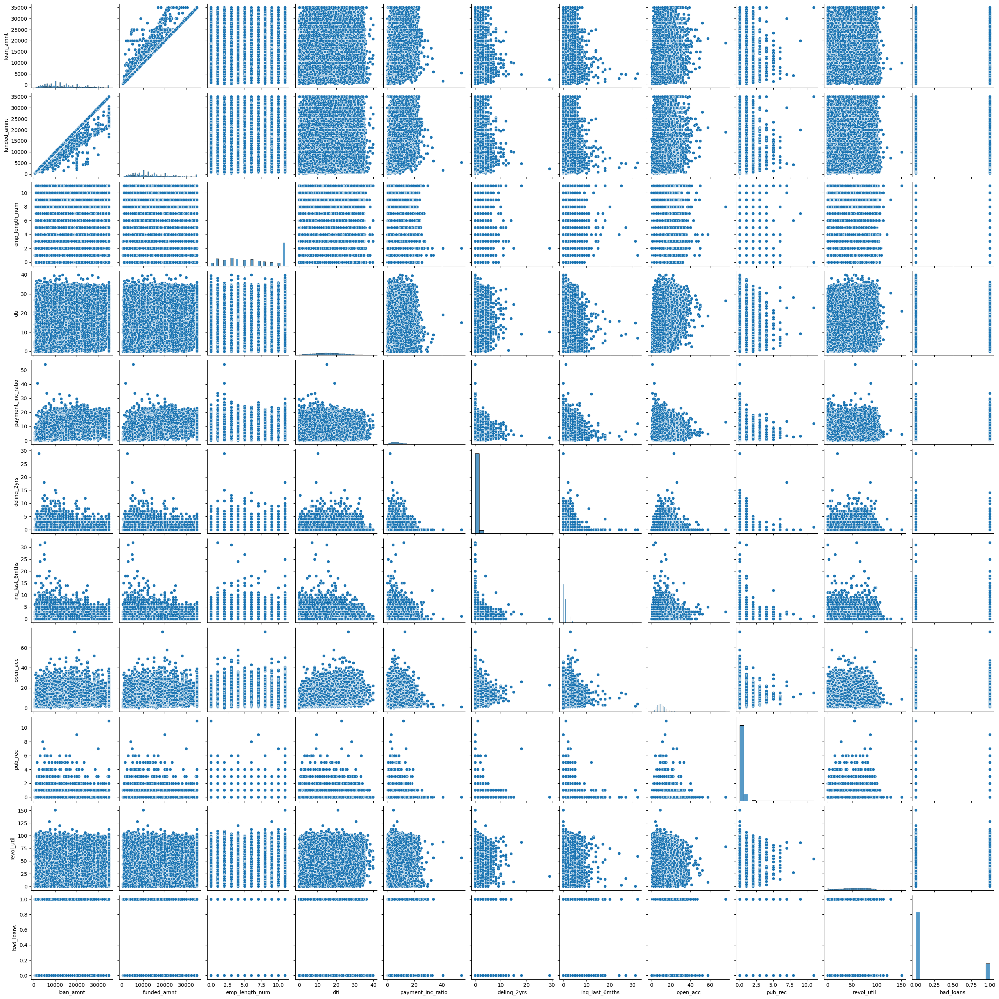

In [19]:
sns.pairplot(df)
plt.show();

### Correlation Matrix For Numerical Features

In [20]:
def show_corr_matrix(data, hight, width):
    corr_mat = data.corr()
    plt.figure(figsize=(width, hight))
    sns.heatmap(corr_mat, square = True, cmap = 'Blues', annot=True, fmt='.2g')
    plt.show()

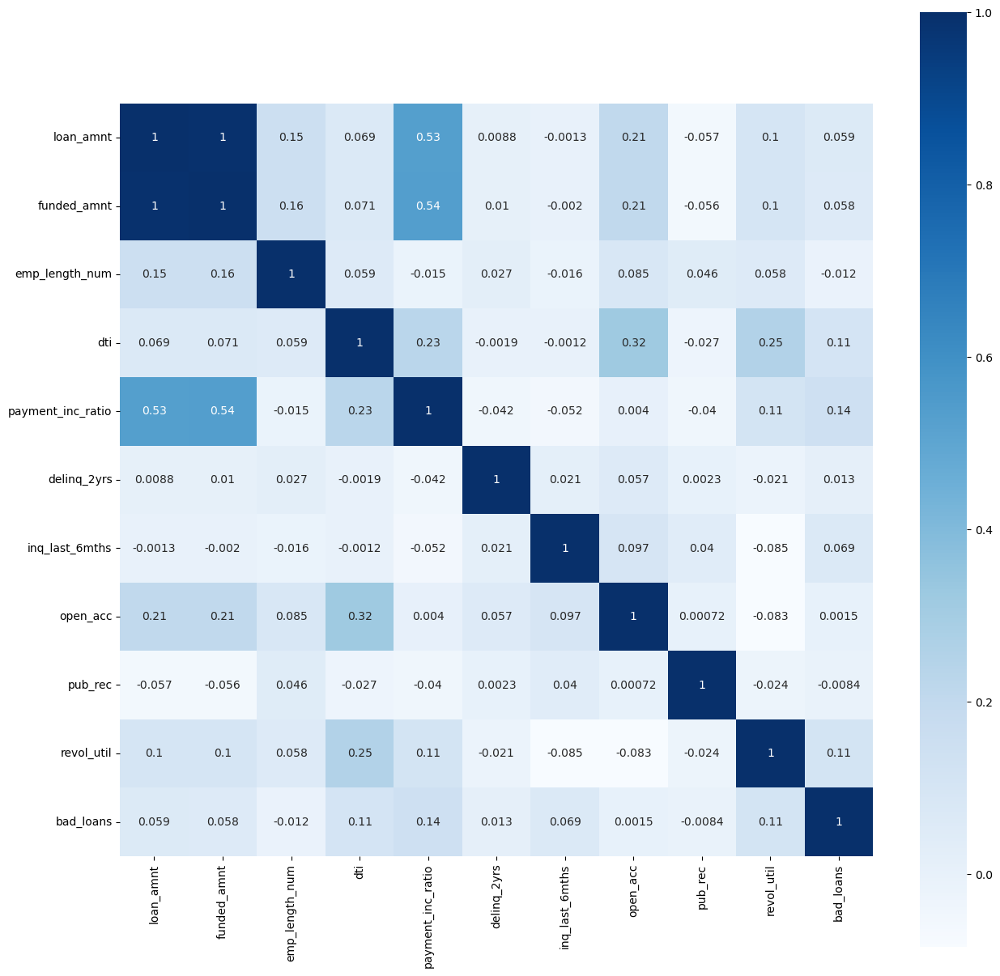

In [21]:
show_corr_matrix(df, 15, 15)

It seems we have high correlation between "loan_amnt" and "funded_amnt" features. let's check that out:

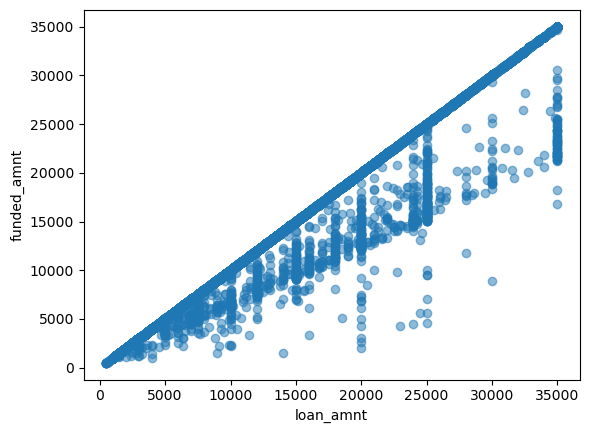

In [22]:
plt.scatter(df['loan_amnt'], df['funded_amnt'], alpha = 0.5)
plt.xlabel('loan_amnt')
plt.ylabel('funded_amnt')
plt.show()

There is almost a linear correlation between these two features. So we can remove one of them:

In [23]:
df = df.drop("funded_amnt", axis="columns")

### Dependence Graphs of Continuous Features on Categorical Features

In [24]:
def show_cont_on_cat(data, continues, categorical):
    f, ax = plt.subplots(1, 2, figsize = (15,5))
    sns.boxplot(x = categorical, y = continues, palette = "Blues", data = data, ax = ax[0])
    sns.histplot(data, x = continues, hue = categorical, multiple = "stack", palette = "Blues",
                 edgecolor = ".3", linewidth = .5, ax = ax[1])
    plt.show()

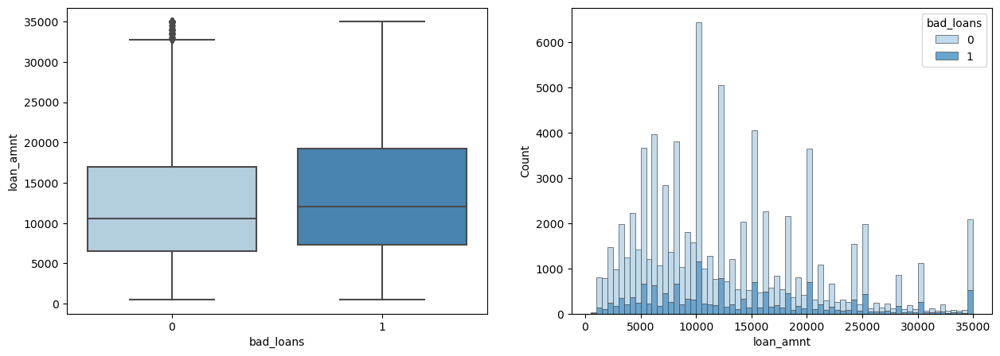

In [25]:
show_cont_on_cat(df, "loan_amnt", "bad_loans")

- Average loan amount of people with bad credit are slightly higher than does with good credit.
- Average loan amount of people with bad credit is about 13000.

### Dependence Graphs of Categorical Features on Categorical Features 

In [26]:
def show_cat_on_cat(data, categorical1, categorical2):
    sns.countplot(x = categorical1, hue = categorical2, palette = "Blues", data = data)
    plt.show()

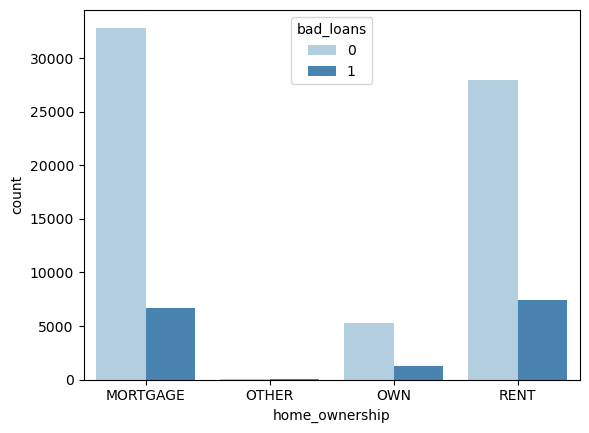

In [27]:
show_cat_on_cat(df, "home_ownership", "bad_loans")

 - Most of the people with bad loan credits are does who rent or mortgage houses.
 - People who rent houses are more likely to have bad loan credits.

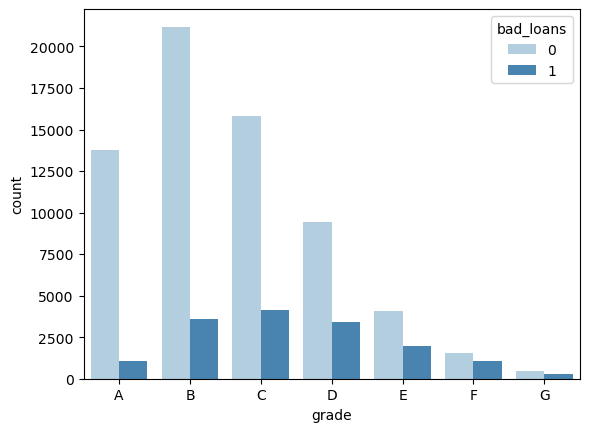

In [28]:
show_cat_on_cat(df, "grade", "bad_loans")

- Most of the people with bad loan credits are from grade C.
- Most of the people with good loan credits are from grade B.

# Dealing With Missing Values

### Missing Value Detection 

In [29]:
df.isna().sum()

loan_amnt                 0
grade                     0
sub_grade_num             0
short_emp                 0
emp_length_num            0
home_ownership            0
dti                       0
purpose                   0
payment_inc_ratio         1
delinq_2yrs              16
delinq_2yrs_zero         16
inq_last_6mths           16
last_delinq_none          0
last_major_derog_none     0
open_acc                 16
pub_rec                  16
pub_rec_zero             16
revol_util                0
bad_loans                 0
dtype: int64

In [30]:
nan_rowes_index = np.where(df.isna().any(axis=1))[0]
nan_columns_index = np.where(df.isna().any())[0]

In [31]:
df.iloc[nan_rowes_index, nan_columns_index]

,payment_inc_ratio,delinq_2yrs,delinq_2yrs_zero,inq_last_6mths,open_acc,pub_rec,pub_rec_zero
25510,1.364500,NaN,NaN,NaN,NaN,NaN,NaN
25521,1.525960,NaN,NaN,NaN,NaN,NaN,NaN
25528,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25536,2.076880,NaN,NaN,NaN,NaN,NaN,NaN
25546,0.732000,NaN,NaN,NaN,NaN,NaN,NaN
25549,1.272330,NaN,NaN,NaN,NaN,NaN,NaN
25550,7.038430,NaN,NaN,NaN,NaN,NaN,NaN
25551,1.373400,NaN,NaN,NaN,NaN,NaN,NaN
25552,1.398450,NaN,NaN,NaN,NaN,NaN,NaN
25553,0.742560,NaN,NaN,NaN,NaN,NaN,NaN


### Missing Value Handling 

In [32]:
df['payment_inc_ratio'].fillna(df['payment_inc_ratio'].median(axis = 0), inplace = True)
df['delinq_2yrs'].fillna(df['delinq_2yrs'].median(axis = 0), inplace = True)
df['delinq_2yrs_zero'].fillna(df['delinq_2yrs_zero'].mode()[0], inplace = True)
df['inq_last_6mths'].fillna(df['inq_last_6mths'].median(axis = 0), inplace = True)
df['open_acc'].fillna(df['open_acc'].median(axis = 0), inplace = True)
df['pub_rec'].fillna(df['pub_rec'].median(axis = 0), inplace = True)
df['pub_rec_zero'].fillna(df['pub_rec_zero'].mode()[0], inplace = True)

In [33]:
df.iloc[nan_rowes_index, nan_columns_index]

,payment_inc_ratio,delinq_2yrs,delinq_2yrs_zero,inq_last_6mths,open_acc,pub_rec,pub_rec_zero
25510,1.364500,0.0,1.0,1.0,10.0,0.0,1.0
25521,1.525960,0.0,1.0,1.0,10.0,0.0,1.0
25528,6.953560,0.0,1.0,1.0,10.0,0.0,1.0
25536,2.076880,0.0,1.0,1.0,10.0,0.0,1.0
25546,0.732000,0.0,1.0,1.0,10.0,0.0,1.0
25549,1.272330,0.0,1.0,1.0,10.0,0.0,1.0
25550,7.038430,0.0,1.0,1.0,10.0,0.0,1.0
25551,1.373400,0.0,1.0,1.0,10.0,0.0,1.0
25552,1.398450,0.0,1.0,1.0,10.0,0.0,1.0
25553,0.742560,0.0,1.0,1.0,10.0,0.0,1.0


In [34]:
df.isna().sum()

loan_amnt                0
grade                    0
sub_grade_num            0
short_emp                0
emp_length_num           0
home_ownership           0
dti                      0
purpose                  0
payment_inc_ratio        0
delinq_2yrs              0
delinq_2yrs_zero         0
inq_last_6mths           0
last_delinq_none         0
last_major_derog_none    0
open_acc                 0
pub_rec                  0
pub_rec_zero             0
revol_util               0
bad_loans                0
dtype: int64

# Data Encoding

In [35]:
data_describe = df.describe(include = ['category'])

# Nonbinary columns
one_hot_cols = [c for c in categorical_columns if data_describe[c]['unique'] > 2]

# Binary columns
dummy_cols = [c for c in categorical_columns if data_describe[c]['unique'] == 2]

# One-Hot Encoding
df = pd.get_dummies(df, columns = one_hot_cols, drop_first=False)

# Dummy Encoding
df = pd.get_dummies(df, columns = dummy_cols, drop_first=True)

df.head()

,loan_amnt,emp_length_num,dti,payment_inc_ratio,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_util,bad_loans,...,purpose_moving,purpose_other,purpose_small_business,purpose_vacation,purpose_wedding,short_emp_1,delinq_2yrs_zero_1.0,last_delinq_none_1,last_major_derog_none_1,pub_rec_zero_1.0
0,5000,11,27.65,8.14350,0.0,1.0,3.0,0.0,83.7,0,...,0,0,0,0,0,0,1,1,1,1
1,2400,11,8.72,8.25955,0.0,2.0,2.0,0.0,98.5,0,...,0,0,1,0,0,0,1,1,1,1
2,5000,4,11.20,5.21533,0.0,3.0,9.0,0.0,28.3,0,...,0,0,0,0,1,0,1,1,1,1
3,3000,10,5.35,2.73575,0.0,2.0,4.0,0.0,87.5,0,...,0,0,0,0,0,0,1,1,1,1
4,5600,5,5.55,4.57170,0.0,2.0,11.0,0.0,32.6,1,...,0,0,1,0,0,0,1,1,1,1


In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81738 entries, 0 to 81737
Data columns (total 43 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   loan_amnt                   81738 non-null  int64  
 1   emp_length_num              81738 non-null  int64  
 2   dti                         81738 non-null  float64
 3   payment_inc_ratio           81738 non-null  float64
 4   delinq_2yrs                 81738 non-null  float64
 5   inq_last_6mths              81738 non-null  float64
 6   open_acc                    81738 non-null  float64
 7   pub_rec                     81738 non-null  float64
 8   revol_util                  81738 non-null  float64
 9   bad_loans                   81738 non-null  int64  
 10  grade_A                     81738 non-null  uint8  
 11  grade_B                     81738 non-null  uint8  
 12  grade_C                     81738 non-null  uint8  
 13  grade_D                     817

# Input-Target Split

In [37]:
X = df.drop("bad_loans", axis="columns")
y = df["bad_loans"]

print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (81738, 42)
y shape: (81738,)


# Train-Validation-Test Split

In [38]:
# set aside 20% of X and y data for evaluation
X_train, X_test, y_train, y_test = train_test_split(X, y,
    test_size=0.2, shuffle = True, random_state = 8)

# Use the same function above for the validation set
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, 
    test_size=0.25, random_state= 8) # 0.25 x 0.8 = 0.2


print(f"X_train shape: {X_train.shape} | {type(X_train)}")
print(f"X_val shape:   {X_val.shape} | {type(X_val)}")
print(f"X_test shape:  {X_test.shape} | {type(X_test)}")
print("--------------------------------")
print(f"y_train shape: {y_train.shape} | {type(y_train)}")
print(f"y_val shape:   {y_val.shape} | {type(y_val)}")
print(f"y_test shape:  {y_test.shape} | {type(y_test)}")

X_train shape: (49042, 42) | <class 'pandas.core.frame.DataFrame'>
X_val shape:   (16348, 42) | <class 'pandas.core.frame.DataFrame'>
X_test shape:  (16348, 42) | <class 'pandas.core.frame.DataFrame'>
--------------------------------
y_train shape: (49042,) | <class 'pandas.core.series.Series'>
y_val shape:   (16348,) | <class 'pandas.core.series.Series'>
y_test shape:  (16348,) | <class 'pandas.core.series.Series'>


In [39]:
X_train.head()

,loan_amnt,emp_length_num,dti,payment_inc_ratio,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_util,grade_A,...,purpose_moving,purpose_other,purpose_small_business,purpose_vacation,purpose_wedding,short_emp_1,delinq_2yrs_zero_1.0,last_delinq_none_1,last_major_derog_none_1,pub_rec_zero_1.0
36664,11700,11,21.31,8.99585,0.0,0.0,9.0,0.0,92.6,0,...,0,0,0,0,0,0,1,1,1,1
14269,11675,11,14.20,5.65667,0.0,0.0,11.0,0.0,56.1,0,...,0,0,0,0,0,0,1,1,1,1
6621,26000,5,7.57,10.07170,0.0,0.0,7.0,0.0,38.1,0,...,0,0,0,0,0,0,1,1,1,1
66097,14000,4,10.38,7.08690,0.0,0.0,8.0,0.0,73.7,0,...,0,0,0,0,1,0,1,1,1,1
12882,3600,3,3.81,3.98229,2.0,0.0,5.0,0.0,9.7,0,...,0,0,0,0,0,0,0,0,1,1


In [40]:
X_val.head()

,loan_amnt,emp_length_num,dti,payment_inc_ratio,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_util,grade_A,...,purpose_moving,purpose_other,purpose_small_business,purpose_vacation,purpose_wedding,short_emp_1,delinq_2yrs_zero_1.0,last_delinq_none_1,last_major_derog_none_1,pub_rec_zero_1.0
15782,12000,11,11.07,5.19147,0.0,2.0,12.0,0.0,35.3,0,...,0,0,0,0,0,0,1,0,1,1
74303,21000,6,6.90,4.44956,0.0,0.0,14.0,0.0,92.7,0,...,0,0,0,0,0,0,1,0,1,1
77826,9000,11,24.12,7.50706,1.0,4.0,16.0,0.0,33.0,0,...,0,0,0,0,0,0,0,0,0,1
78053,21100,7,22.40,15.42260,0.0,1.0,18.0,1.0,46.6,0,...,0,1,0,0,0,0,1,0,0,0
22088,11000,1,13.94,9.23974,0.0,0.0,9.0,0.0,48.7,0,...,0,0,0,0,0,1,1,0,1,1


In [41]:
X_test.head()

,loan_amnt,emp_length_num,dti,payment_inc_ratio,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_util,grade_A,...,purpose_moving,purpose_other,purpose_small_business,purpose_vacation,purpose_wedding,short_emp_1,delinq_2yrs_zero_1.0,last_delinq_none_1,last_major_derog_none_1,pub_rec_zero_1.0
58033,7200,1,20.17,4.49280,0.0,2.0,10.0,0.0,49.0,0,...,0,0,0,0,0,1,1,1,1,1
59558,8000,11,15.06,8.43000,0.0,1.0,5.0,0.0,90.1,0,...,0,0,0,0,0,0,1,1,1,1
58481,16000,11,22.31,5.74875,1.0,2.0,5.0,0.0,49.5,0,...,0,1,0,0,0,0,0,0,1,1
57927,10000,11,26.53,9.15707,0.0,2.0,9.0,0.0,32.8,0,...,0,0,0,0,0,0,1,0,0,1
48473,15000,5,12.82,3.57876,0.0,1.0,17.0,1.0,49.8,0,...,0,0,0,0,0,0,1,0,0,0


# Over Sampling

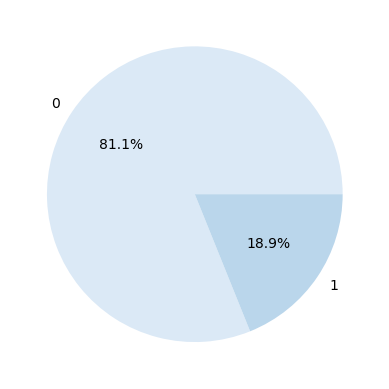

In [42]:
target_variable_ratio(y_train)

In [43]:
smote = SMOTE()
X_train, y_train = smote.fit_resample(X_train, y_train)

print(X_train.shape, y_train.shape)

(79550, 42) (79550,)


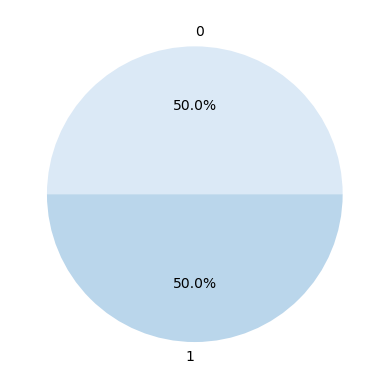

In [44]:
target_variable_ratio(y_train)

# Input Data Scaling

In [45]:
X_train.describe().round(decimals=2)

,loan_amnt,emp_length_num,dti,payment_inc_ratio,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_util,grade_A,...,purpose_moving,purpose_other,purpose_small_business,purpose_vacation,purpose_wedding,short_emp_1,delinq_2yrs_zero_1.0,last_delinq_none_1,last_major_derog_none_1,pub_rec_zero_1.0
count,79550.00,79550.00,79550.00,79550.00,79550.00,79550.00,79550.00,79550.00,79550.00,79550.00,...,79550.00,79550.00,79550.00,79550.00,79550.00,79550.00,79550.00,79550.0,79550.00,79550.00
mean,13196.47,6.24,16.16,8.01,0.22,1.05,10.43,0.10,56.16,0.12,...,0.01,0.05,0.02,0.00,0.01,0.09,0.81,0.5,0.83,0.88
std,8061.55,3.61,7.27,4.10,0.62,1.23,4.51,0.33,25.03,0.32,...,0.08,0.22,0.13,0.07,0.09,0.28,0.39,0.5,0.37,0.33
min,500.00,0.00,0.00,0.08,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00
25%,7000.00,3.00,10.74,4.80,0.00,0.00,7.00,0.00,38.10,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.0,1.00,1.00
50%,11500.00,6.00,16.08,7.56,0.00,1.00,10.00,0.00,58.50,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.0,1.00,1.00
75%,18000.00,10.00,21.43,10.84,0.00,1.82,13.00,0.00,76.30,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.0,1.00,1.00
max,35000.00,11.00,39.88,54.17,29.00,32.00,76.00,11.00,150.70,1.00,...,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.0,1.00,1.00


In [46]:
# z-score standardization
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

In [47]:
print(f"Type of X_train_scaled: {type(X_train_scaled)} | shape: {X_train_scaled.shape}")
print(f"Type of X_val_scaled:   {type(X_val_scaled)} | shape: {X_val_scaled.shape}")
print(f"Type of X_test_scaled:  {type(X_test_scaled)} | shape: {X_test_scaled.shape}")

Type of X_train_scaled: <class 'numpy.ndarray'> | shape: (79550, 42)
Type of X_val_scaled:   <class 'numpy.ndarray'> | shape: (16348, 42)
Type of X_test_scaled:  <class 'numpy.ndarray'> | shape: (16348, 42)


In [48]:
df_X_train_scaled = pd.DataFrame(X_train_scaled, columns=X.columns)
df_X_train_scaled.describe().round(decimals=2)

,loan_amnt,emp_length_num,dti,payment_inc_ratio,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_util,grade_A,...,purpose_moving,purpose_other,purpose_small_business,purpose_vacation,purpose_wedding,short_emp_1,delinq_2yrs_zero_1.0,last_delinq_none_1,last_major_derog_none_1,pub_rec_zero_1.0
count,79550.00,79550.00,79550.00,79550.00,79550.00,79550.00,79550.00,79550.00,79550.00,79550.00,...,79550.00,79550.00,79550.00,79550.00,79550.00,79550.00,79550.00,79550.0,79550.00,79550.00
mean,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,...,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.0,-0.00,-0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,...,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.0,1.00,1.00
min,-1.57,-1.73,-2.22,-1.93,-0.35,-0.85,-2.31,-0.31,-2.24,-0.36,...,-0.08,-0.23,-0.14,-0.07,-0.09,-0.31,-2.06,-1.0,-2.24,-2.69
25%,-0.77,-0.90,-0.75,-0.78,-0.35,-0.85,-0.76,-0.31,-0.72,-0.36,...,-0.08,-0.23,-0.14,-0.07,-0.09,-0.31,0.49,-1.0,0.45,0.37
50%,-0.21,-0.07,-0.01,-0.11,-0.35,-0.04,-0.10,-0.31,0.09,-0.36,...,-0.08,-0.23,-0.14,-0.07,-0.09,-0.31,0.49,-1.0,0.45,0.37
75%,0.60,1.04,0.72,0.69,-0.35,0.63,0.57,-0.31,0.80,-0.36,...,-0.08,-0.23,-0.14,-0.07,-0.09,-0.31,0.49,1.0,0.45,0.37
max,2.70,1.32,3.26,11.26,46.43,25.23,14.53,33.06,3.78,2.77,...,12.97,4.31,7.36,15.24,11.18,3.22,0.49,1.0,0.45,0.37


# Model: MLP Neural Network

In [49]:
def generate_neural_network_model(input_shape):
    
    # build the model!
    model = Sequential()
    model.add(Dense(100, input_shape=(input_shape,), activation='relu')) 
    model.add(Dropout(0.2))
    model.add(Dense(250, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(50, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(2, activation='softmax')) # output nodes

    # compile the model
    model.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=2, clipvalue=7),
                  loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

In [50]:
def fit_neural_network_model(X_train, y_train, val_data, verbose=1): 
    
    model = generate_neural_network_model(X_train.shape[-1])
    
    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    
#     y_org = np.argmax(y_train, axis=1)
#     class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(y_org), y=y_org)

    history = model.fit(X_train, y_train, 
                        validation_data=val_data, 
                        callbacks=[early_stop],
                        epochs=100,
                        batch_size=32,
                        shuffle=True,
                        verbose=verbose)
                        # class_weight=dict(zip(np.unique(y_train), class_weights))
    
    return model, history

In [51]:
def show_neural_network_learning_curve(train_loss, val_loss):
    
    plt.plot(train_loss, 'blue', label='Training loss')
    plt.plot(val_loss, 'orange', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.show()

In [52]:
def show_confusion_matrix(y_test, y_predict):
    cm = confusion_matrix(y_true=y_test, y_pred=y_predict)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm) # display_labels=clf.classes_
    disp.plot()
    plt.show()

In [53]:
def make_prediction(pred_prob, threshold):
    predict = np.zeros(len(pred_prob))
    predict[pred_prob[:, 1]>threshold] = 1 
    return predict

### Generating The Model Architecture

In [54]:
model = generate_neural_network_model(X_train_scaled.shape[-1])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 100)               4300      
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense_1 (Dense)             (None, 250)               25250     
                                                                 
 dropout_1 (Dropout)         (None, 250)               0         
                                                                 
 dense_2 (Dense)             (None, 100)               25100     
                                                                 
 dropout_2 (Dropout)         (None, 100)               0         
                                                                 
 dense_3 (Dense)             (None, 50)                5

### Training The Model 

In [55]:
y_train_cat = to_categorical(y_train)
y_val_cat = to_categorical(y_val)
# y_test_cat = to_categorical(y_test)

print(f"y_train_cat shape: {y_train_cat.shape} | {type(y_train_cat)}")
print(f"y_val_cat shape:   {y_val_cat.shape} | {type(y_val_cat)}")
# print(f"y_test_cat shape:  {y_test_cat.shape} | {type(y_test_cat)}")

y_train_cat shape: (79550, 2) | <class 'numpy.ndarray'>
y_val_cat shape:   (16348, 2) | <class 'numpy.ndarray'>


In [56]:
model, modelhistory = fit_neural_network_model(X_train_scaled, y_train_cat, val_data=(X_val_scaled, y_val_cat), verbose=1)

Epoch 1/100
2486/2486 [==============================] - 15s 4ms/step - loss: 0.3905 - accuracy: 0.8294 - val_loss: 0.4607 - val_accuracy: 0.8100
Epoch 2/100
2486/2486 [==============================] - 11s 4ms/step - loss: 0.3154 - accuracy: 0.8677 - val_loss: 0.4598 - val_accuracy: 0.8108
Epoch 3/100
2486/2486 [==============================] - 11s 4ms/step - loss: 0.3035 - accuracy: 0.8724 - val_loss: 0.4538 - val_accuracy: 0.8110
Epoch 4/100
2486/2486 [==============================] - 16s 6ms/step - loss: 0.2982 - accuracy: 0.8750 - val_loss: 0.4543 - val_accuracy: 0.8106
Epoch 5/100
2486/2486 [==============================] - 14s 6ms/step - loss: 0.2941 - accuracy: 0.8759 - val_loss: 0.4517 - val_accuracy: 0.8106
Epoch 6/100
2486/2486 [==============================] - 15s 6ms/step - loss: 0.2911 - accuracy: 0.8774 - val_loss: 0.4522 - val_accuracy: 0.8106
Epoch 7/100
2486/2486 [==============================] - 11s 4ms/step - loss: 0.2892 - accuracy: 0.8777 - val_loss: 0.4521 -

### Visualizing the Learning Curve

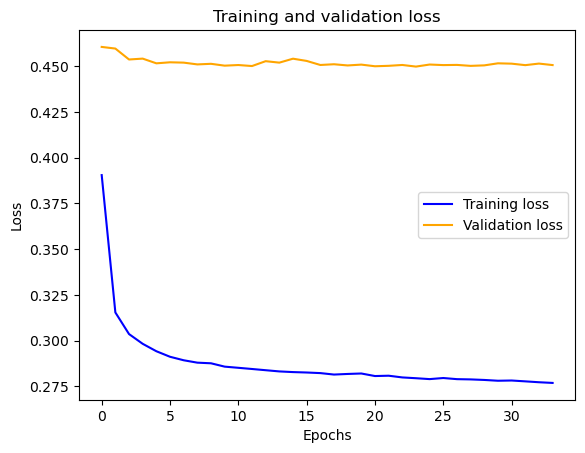

In [57]:
train_loss = modelhistory.history["loss"]
val_loss = modelhistory.history["val_loss"]

show_neural_network_learning_curve(train_loss, val_loss)

### Prediction Probabilities

In [58]:
train_pred_prob = model.predict(X_train_scaled)
val_pred_prob = model.predict(X_val_scaled)
test_pred_prob = model.predict(X_test_scaled)

511/511 [==============================] - 1s 1ms/step


### Model Performance on Test Set

#### Class Thresholds: class 0 > 0.5  | class 1 > 0.5

In [59]:
y_test_predict = np.argmax(test_pred_prob, axis=1)

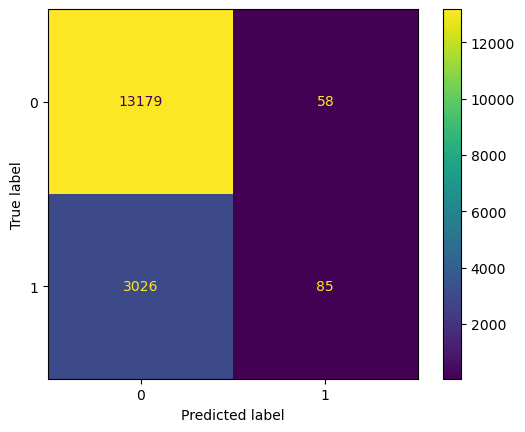

In [60]:
show_confusion_matrix(y_test, y_test_predict)

In [61]:
print(classification_report(y_true=y_test, y_pred=y_test_predict))

              precision    recall  f1-score   support

           0       0.81      1.00      0.90     13237
           1       0.59      0.03      0.05      3111

    accuracy                           0.81     16348
   macro avg       0.70      0.51      0.47     16348
weighted avg       0.77      0.81      0.73     16348



In [62]:
print("Macro-average F1-score:", f1_score(y_test, y_test_predict, average='macro'))

Macro-average F1-score: 0.47374753700952027


#### Class Thresholds: class 0 > 0.74  | class 1 > 0.26

In [63]:
## Finding the best threshold for class 1 to give us the highest F1-score:

thresholds = np.linspace(0, 0.5, 100) # All possible thresholds for class 1
f1_scores = [f1_score(y_test, make_prediction(test_pred_prob, i), average='macro') for i in thresholds]
best_threshold = thresholds[f1_scores.index(max(f1_scores))]

print("Best threshold for class 1:", best_threshold)
print("Best Macro-average F1-score:", max(f1_scores))

Best threshold for class 1: 0.2828282828282829
Best Macro-average F1-score: 0.6055605290478114


In [64]:
y_test_predict = make_prediction(test_pred_prob, best_threshold)

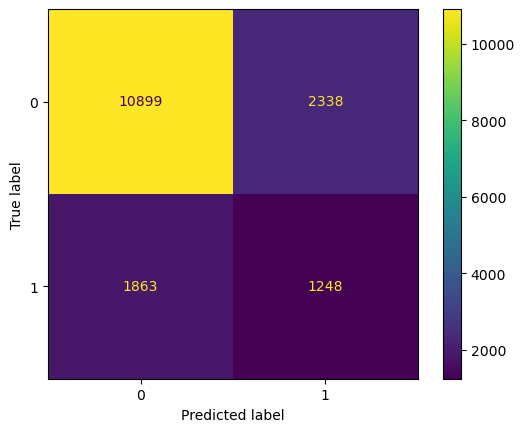

In [65]:
show_confusion_matrix(y_test, y_test_predict)

In [66]:
print(classification_report(y_true=y_test, y_pred=y_test_predict))

              precision    recall  f1-score   support

           0       0.85      0.82      0.84     13237
           1       0.35      0.40      0.37      3111

    accuracy                           0.74     16348
   macro avg       0.60      0.61      0.61     16348
weighted avg       0.76      0.74      0.75     16348



In [67]:
print("Macro-average F1-score:", f1_score(y_test, y_test_predict, average='macro'))

Macro-average F1-score: 0.6055605290478114


# Deployment

### Training The Best Model On The Whole Dataset

In [68]:
print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (81738, 42)
y shape: (81738,)


In [69]:
# set aside 20% of X and y data for validation
X_train_, X_val_, y_train_, y_val_ = train_test_split(X, y,
    test_size=0.2, shuffle = True, random_state = 8)

print(f"X_train_ shape: {X_train_.shape} | {type(X_train_)}")
print(f"X_val_ shape:   {X_val_.shape} | {type(X_val_)}")
print("--------------------------------")
print(f"y_train_ shape: {y_train_.shape} | {type(y_train_)}")
print(f"y_val_ shape:   {y_val_.shape} | {type(y_val_)}")

X_train_ shape: (65390, 42) | <class 'pandas.core.frame.DataFrame'>
X_val_ shape:   (16348, 42) | <class 'pandas.core.frame.DataFrame'>
--------------------------------
y_train_ shape: (65390,) | <class 'pandas.core.series.Series'>
y_val_ shape:   (16348,) | <class 'pandas.core.series.Series'>


In [70]:
smote = SMOTE()
X_train_, y_train_ = smote.fit_resample(X_train_, y_train_)

print("X_train_ shape:", X_train_.shape)
print("y_train_ shape:", y_train_.shape)

X_train_ shape: (106058, 42)
y_train_ shape: (106058,)


In [71]:
# z-score standardization
scaler_ = StandardScaler()
X_train_scaled_ = scaler_.fit_transform(X_train_)
X_val_scaled_ = scaler_.transform(X_val_)

In [72]:
y_train_cat_ = to_categorical(y_train_)
y_val_cat_ = to_categorical(y_val_)

print(f"y_train_cat shape: {y_train_cat_.shape} | {type(y_train_cat_)}")
print(f"y_val_cat shape:   {y_val_cat_.shape} | {type(y_val_cat_)}")

y_train_cat shape: (106058, 2) | <class 'numpy.ndarray'>
y_val_cat shape:   (16348, 2) | <class 'numpy.ndarray'>


In [73]:
best_model, modelhistory_ = fit_neural_network_model(X_train_scaled_, y_train_cat_, val_data=(X_val_scaled_, y_val_cat_), verbose=1)

Epoch 1/100
3315/3315 [==============================] - 18s 4ms/step - loss: 0.3884 - accuracy: 0.8293 - val_loss: 0.4648 - val_accuracy: 0.8093
Epoch 2/100
3315/3315 [==============================] - 15s 4ms/step - loss: 0.3109 - accuracy: 0.8701 - val_loss: 0.4547 - val_accuracy: 0.8097
Epoch 3/100
3315/3315 [==============================] - 14s 4ms/step - loss: 0.3007 - accuracy: 0.8733 - val_loss: 0.4563 - val_accuracy: 0.8096
Epoch 4/100
3315/3315 [==============================] - 15s 5ms/step - loss: 0.2947 - accuracy: 0.8758 - val_loss: 0.4538 - val_accuracy: 0.8096
Epoch 5/100
3315/3315 [==============================] - 14s 4ms/step - loss: 0.2914 - accuracy: 0.8769 - val_loss: 0.4533 - val_accuracy: 0.8095
Epoch 6/100
3315/3315 [==============================] - 15s 5ms/step - loss: 0.2889 - accuracy: 0.8782 - val_loss: 0.4531 - val_accuracy: 0.8100
Epoch 7/100
3315/3315 [==============================] - 14s 4ms/step - loss: 0.2879 - accuracy: 0.8780 - val_loss: 0.4527 -

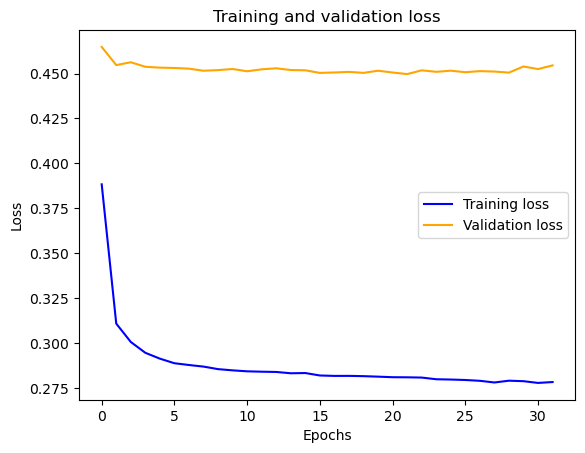

In [74]:
train_loss_ = modelhistory_.history["loss"]
val_loss_ = modelhistory_.history["val_loss"]

show_neural_network_learning_curve(train_loss_, val_loss_)

### Preprocessing The Test Data

In [75]:
df_test = pd.read_csv(r"data\test.csv")

df_test.loc[:, categorical_columns] = df_test.loc[:, categorical_columns].astype('category')
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40869 entries, 0 to 40868
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   loan_amnt              40869 non-null  int64   
 1   funded_amnt            40869 non-null  int64   
 2   pymnt_plan             40869 non-null  object  
 3   grade                  40869 non-null  category
 4   sub_grade_num          40869 non-null  category
 5   short_emp              40869 non-null  category
 6   emp_length_num         40869 non-null  int64   
 7   home_ownership         40869 non-null  category
 8   dti                    40869 non-null  float64 
 9   purpose                40869 non-null  category
 10  payment_inc_ratio      40866 non-null  float64 
 11  delinq_2yrs            40856 non-null  float64 
 12  delinq_2yrs_zero       40856 non-null  category
 13  inq_last_6mths         40856 non-null  float64 
 14  last_delinq_none       40869 non-null 

In [76]:
df_test.drop('pymnt_plan', axis=1, inplace=True)
df_test.drop("funded_amnt", axis=1, inplace=True)

In [77]:
df_test.isna().sum()

loan_amnt                 0
grade                     0
sub_grade_num             0
short_emp                 0
emp_length_num            0
home_ownership            0
dti                       0
purpose                   0
payment_inc_ratio         3
delinq_2yrs              13
delinq_2yrs_zero         13
inq_last_6mths           13
last_delinq_none          0
last_major_derog_none     0
open_acc                 13
pub_rec                  13
pub_rec_zero             13
revol_util                0
dtype: int64

In [78]:
df_test['payment_inc_ratio'].fillna(df_test['payment_inc_ratio'].median(axis = 0), inplace = True)
df_test['delinq_2yrs'].fillna(df_test['delinq_2yrs'].median(axis = 0), inplace = True)
df_test['delinq_2yrs_zero'].fillna(df_test['delinq_2yrs_zero'].mode()[0], inplace = True)
df_test['inq_last_6mths'].fillna(df_test['inq_last_6mths'].median(axis = 0), inplace = True)
df_test['open_acc'].fillna(df_test['open_acc'].median(axis = 0), inplace = True)
df_test['pub_rec'].fillna(df_test['pub_rec'].median(axis = 0), inplace = True)
df_test['pub_rec_zero'].fillna(df_test['pub_rec_zero'].mode()[0], inplace = True)

In [79]:
df_test.isna().sum()

loan_amnt                0
grade                    0
sub_grade_num            0
short_emp                0
emp_length_num           0
home_ownership           0
dti                      0
purpose                  0
payment_inc_ratio        0
delinq_2yrs              0
delinq_2yrs_zero         0
inq_last_6mths           0
last_delinq_none         0
last_major_derog_none    0
open_acc                 0
pub_rec                  0
pub_rec_zero             0
revol_util               0
dtype: int64

In [80]:
data_describe = df_test.describe(include = ['category'])

# Nonbinary columns
one_hot_cols = [c for c in categorical_columns if data_describe[c]['unique'] > 2]

# Binary columns
dummy_cols = [c for c in categorical_columns if data_describe[c]['unique'] == 2]

# One-Hot Encoding
df_test = pd.get_dummies(df_test, columns = one_hot_cols, drop_first=False)

# Dummy Encoding
df_test = pd.get_dummies(df_test, columns = dummy_cols, drop_first=True)

df_test.head()

,loan_amnt,emp_length_num,dti,payment_inc_ratio,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,revol_util,grade_A,...,purpose_moving,purpose_other,purpose_small_business,purpose_vacation,purpose_wedding,short_emp_1,delinq_2yrs_zero_1.0,last_delinq_none_1,last_major_derog_none_1,pub_rec_zero_1.0
0,3600,11,15.37,2.27848,0.0,0.0,9.0,0.0,82.9,0,...,0,0,0,0,0,0,1,1,1,1
1,8875,6,5.83,7.41624,0.0,0.0,11.0,1.0,59.1,0,...,0,0,0,0,0,0,1,1,1,0
2,1500,6,4.18,2.07021,0.0,3.0,2.0,0.0,0.0,0,...,0,0,0,0,0,0,1,0,1,1
3,20000,11,18.72,8.94428,0.0,0.0,9.0,0.0,62.0,0,...,0,0,0,0,0,0,1,1,1,1
4,17000,11,13.22,9.96572,0.0,0.0,7.0,0.0,48.1,1,...,0,0,0,0,0,0,1,0,0,1


In [81]:
X_test_scaled_ = scaler.transform(df_test)

### Making Predictions

In [82]:
test_pred_prob_ = best_model.predict(X_test_scaled_)

1278/1278 [==============================] - 4s 1ms/step


In [83]:
y_test_predict_ = make_prediction(test_pred_prob_, best_threshold)

In [84]:
df_pred = pd.DataFrame(y_test_predict_)
df_pred.head()

,0
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0


In [85]:
df_pred.to_csv('Submission.csv', index=False, header=None)